# Mapping Allen institute scRNA-seq reference to Visium spatial (mouse brain)

## Contents:
* [Loading packages](#Loading_packages)
* [Loading Visium data](#read_visium)
* [Loading Allen single cell reference data](#read_allen)


* [cell2location analysis](#cell2location)
* [Loading cell2location results](#cell2location_res)
* [Evaluate mapping accuracy by comparing to Allen](#mapping_accuracy)


* [Fig 2J](#Fig2J)
* [Fig 2J supplementary spatial maps](#suppl_spatial_maps)

### Loading packages <a class="anchor" id="Loading_packages"></a>

In [1]:
import sys, ast, os
import time
import pickle
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt 
import scipy.sparse as ss
import h5py
import pyro
import matplotlib
data_type = 'float32'

# sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/BayraktarLab/cell2location/')
# sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/cell2location_dev/')

sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/BayraktarLab/scvi-tools/')

# import cell2location
#from cell2location.plt.plot_heatmap import clustermap

import scvi

from matplotlib import rcParams
import seaborn as sns
import glob

# scanpy prints a lot of warnings
import warnings
warnings.filterwarnings('ignore')

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
%config InlineBackend.figure_format = 'retina'

`THEANO_FLAGS='force_device=True'` forces the package to use GPU. Pay attention to error messages that might indicate theano failed to initalise the GPU.   
Do not forget to change `device=cuda0` to your available GPU id. Use `device=cuda` / `device=cuda0` if you have just one locally or if you are requesting one GPU via HPC cluster job.    
You should see a message similar to the one below confirming that `theano` started using the GPU:
```
Using cuDNN version 7605 on context None
Mapped name None to device cuda0: Tesla V100-SXM2-32GB (0000:89:00.0)
```

## Loading Visium data <a class="anchor" id="read_visium"></a>

First let's read spatial Visium data from 10X Space Ranger output. Here we load sample annotations.

In [2]:
sp_data_folder = '/nfs/team205/vk7/sanger_projects/cell2location_proj/notebooks/data/viseum_cortex_trial/'
sc_data_folder = '/nfs/team205/vk7/sanger_projects/large_data/brains/mouse_allen/'
results_folder = '/nfs/team205/vk7/sanger_projects/cell2location_paper/notebooks/selected_results/mouse_brain_allen/'
scvi_run_name_global = f'{results_folder}/SSp_mapping_Adam_lr0002_40k_normalisingSS2_100'

sample_data = pd.read_csv(sp_data_folder + 'Visum_mouse.csv')

In [3]:
sample_data

,sample_name,sample_name2,image_name,slide,position
0,ST8059048,Visium-28C,mouse_brain_he_Library_028_C05717_020_C1_14460...,C05717-020,C1
1,ST8059049,Visium-28D,mouse_brain_he_Library_028_C05717_020_D1_14460...,C05717-020,D1
2,ST8059050,Visium-28E,mouse_brain_he_Library_028_C05717_020_E1_14460...,C05717-020,E1
3,ST8059051,Visium-29B,mouse_brain_he_Library_029_C05717_021_B1_14460...,C05717-021,B1
4,ST8059052,Visium-29C,mouse_brain_he_Library_029_C05717_021_C1_14460...,C05717-021,C1


Next we load the mRNA count for each Visium slide and corresponding histology images as a list `slides` and as a single anndata object `adata`. We need this redundancy because scanpy plotting over the histology image does not work with multiple sections.   

In [4]:
def read_and_qc(sample_name, path=sp_data_folder + 'rawdata/'):
    
    adata = sc.read_visium(path + str(sample_name),
                           count_file='filtered_feature_bc_matrix.h5', load_images=True)
    adata.obs['sample'] = sample_name
    adata.var['SYMBOL'] = adata.var_names
    adata.var.rename(columns={'gene_ids': 'ENSEMBL'}, inplace=True)
    adata.var_names = adata.var['ENSEMBL']
    adata.var.drop(columns='ENSEMBL', inplace=True)

    # Calculate QC metrics
    sc.pp.calculate_qc_metrics(adata, inplace=True)
    adata.var['mt'] = [gene.startswith('mt-') for gene in adata.var['SYMBOL']]
    adata.obs['mt_frac'] = adata[:, adata.var['mt'].tolist()].X.sum(1).A.squeeze()/adata.obs['total_counts']
    
    # add sample name to obs names
    adata.obs["sample"] = [str(i) for i in adata.obs['sample']]
    adata.obs_names = adata.obs["sample"] \
                          + '_' + adata.obs_names
    adata.obs.index.name = 'spot_id'
    
    return adata

# read first sample
adata = read_and_qc(sample_data['sample_name'][0],
                    path=sp_data_folder + 'rawdata/') 

# read the remaining samples
slides = {}
for i in sample_data['sample_name'][1:]:
    adata_1 = read_and_qc(i, path=sp_data_folder + 'rawdata/') 
    slides[str(i)] = adata_1

adata_0 = adata.copy()
    
# combine individual samples
#adata = adata.concatenate(list(slides.values()), index_unique=None)
adata = adata.concatenate(
    list(slides.values()),
    batch_key="sample",
    uns_merge="unique",
    batch_categories=list(sample_data['sample_name'].values), 
    index_unique=None
)

obs = adata.obs.merge(sample_data, left_on='sample', right_on='sample_name')
obs.index = adata.obs_names
adata.obs = obs

slides[str(sample_data['sample_name'][0])] = adata_0

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [5]:
# read in manual SSp cortical layer annotations
lay = pd.DataFrame()
for s in slides.keys():
    
    lay_file = results_folder + 'manual_SSp_layers/SSp_ManLayerAnn_' \
                + str(s) + '.csv'
    lay_ = pd.read_csv(lay_file, index_col='Barcode')
    lay_.index = [str(s) + '_' + i for i in lay_.index]
    lay = pd.concat([lay, lay_])
    
    slides[s].obs['SSp_manual_layers'] = lay_.reindex(index=slides[s].obs_names)
    
adata.obs['SSp_manual_layers'] = lay.reindex(index=adata.obs_names) 

In [6]:
adata.obs['SSp_manual_layers'].isna().sum()

13575

... storing 'sample' as categorical
... storing 'SSp_manual_layers' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical


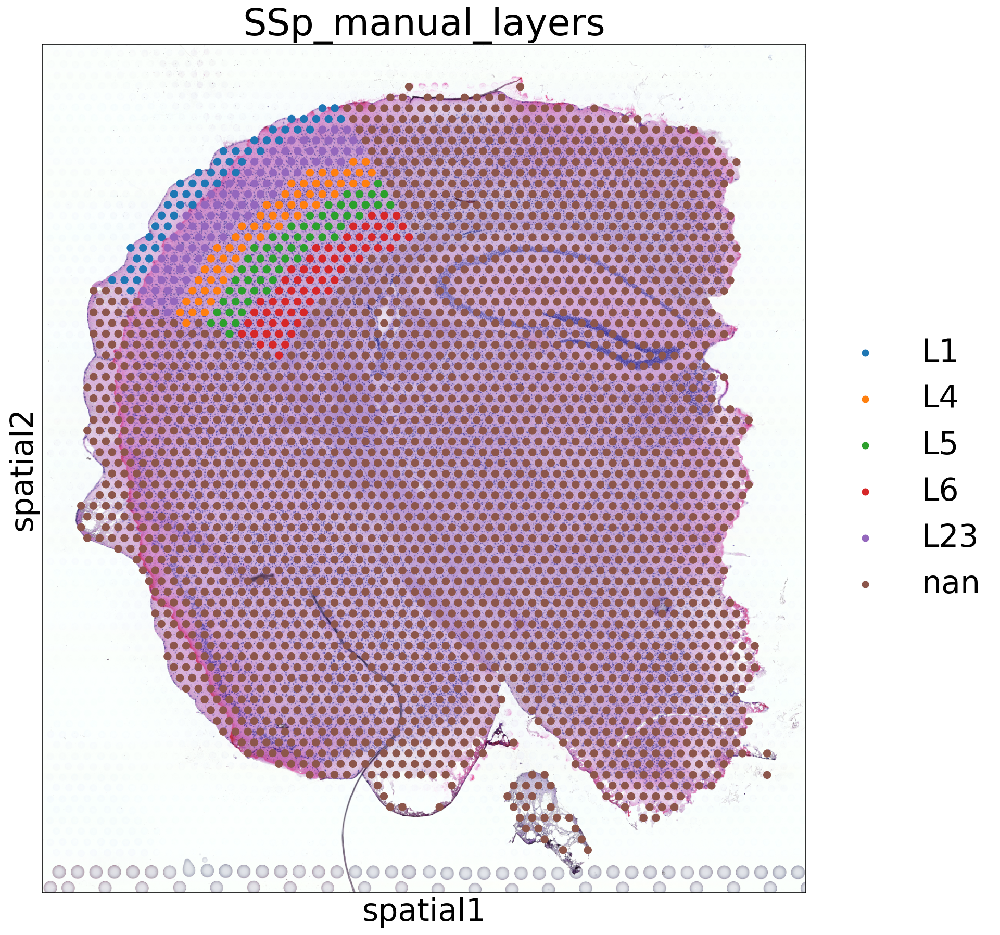

In [7]:
with matplotlib.rc_context({'axes.facecolor':  'white', 'figure.figsize': [15, 15], 'font.size': 30}):
    sc.pl.spatial(slides['ST8059048'], img_key = "hires", cmap='magma',
                  color=['SSp_manual_layers'], size=1,
                  gene_symbols='SYMBOL', ncols=1,
                  save=None)
#                   save='Fig2I_layers_full.pdf')

In [8]:
adata.obs['sample'].value_counts()

ST8059049    3499
ST8059050    3497
ST8059048    2987
ST8059052    2576
ST8059051    2409
Name: sample, dtype: int64

In [9]:
# filter to cortical regions
ind = ~ adata.obs['SSp_manual_layers'].isna()
adata = adata[ind, :]

for i in slides.keys():
    ind = ~ (np.array(slides[i].obs['SSp_manual_layers'].isna()) \
             | np.array(slides[i].obs['SSp_manual_layers'].isin(['nan'])))
    slides[i] = slides[i][ind, :]

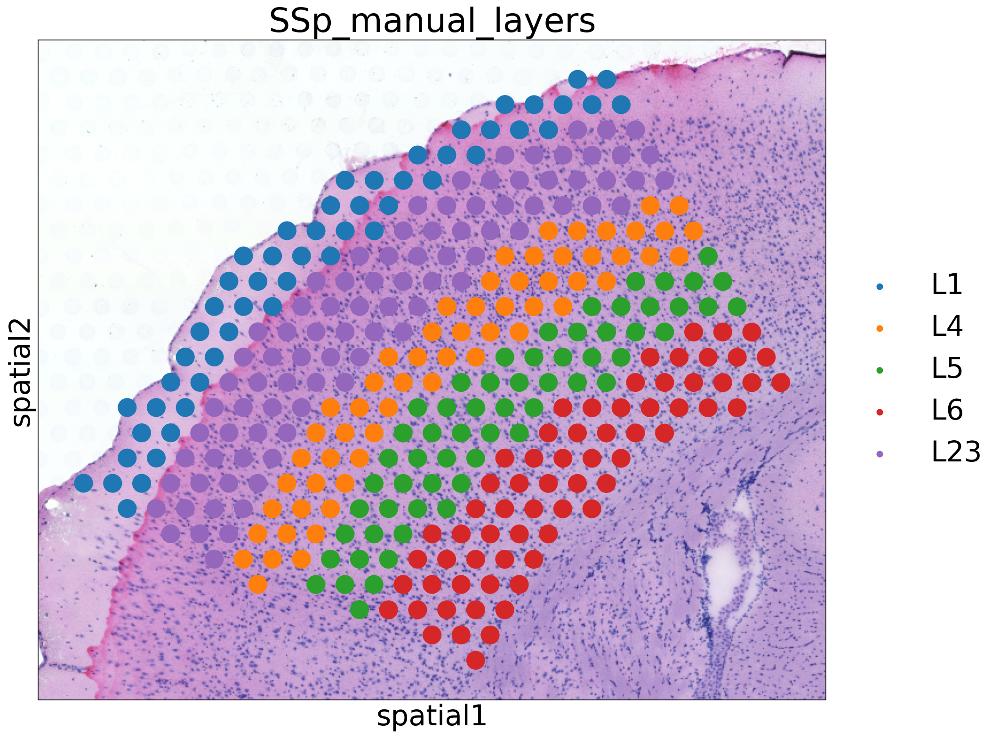

In [10]:
with matplotlib.rc_context({'axes.facecolor':  'white', 'figure.figsize': [15, 15], 'font.size': 30}):
    sc.pl.spatial(slides['ST8059048'], img_key = "hires", cmap='magma',
                  color=['SSp_manual_layers'], size=1,
                  gene_symbols='SYMBOL', ncols=1,
                  save=None)
#                   save='Fig2I_layers_zoom.pdf')

Now let's look at QC: total number of counts and total number of genes per spot

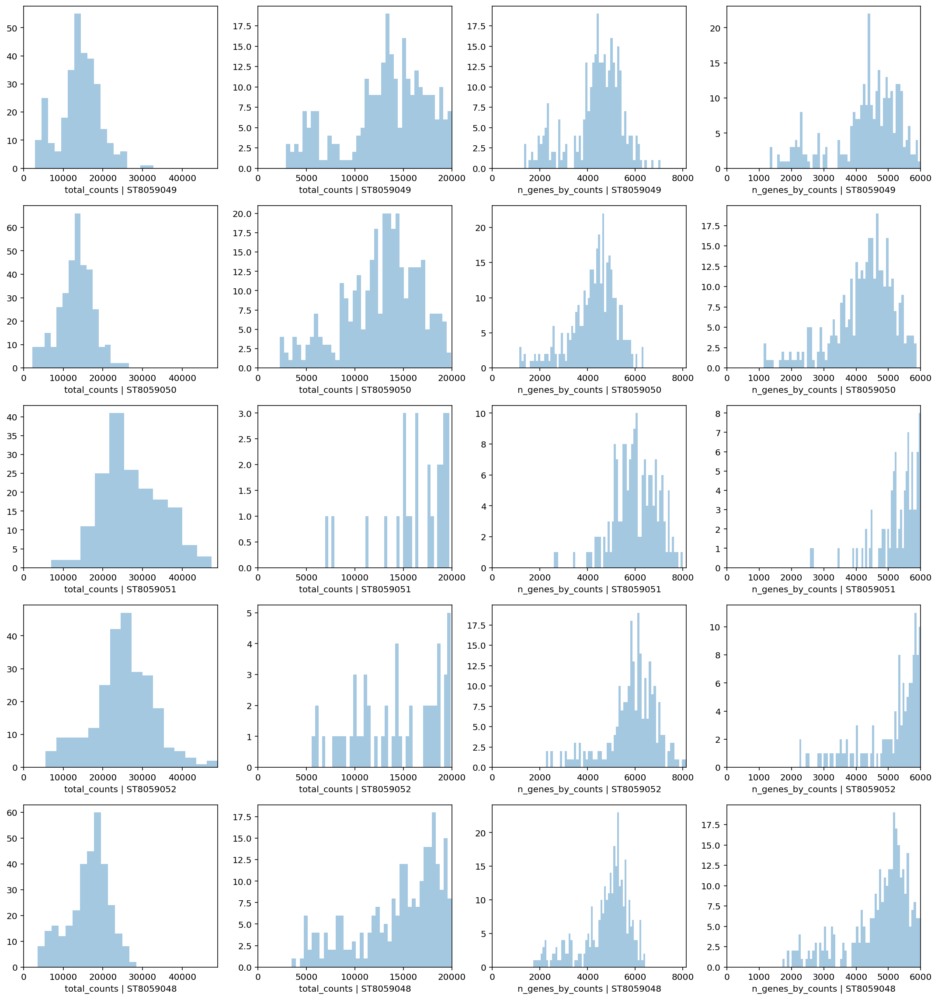

In [11]:
# PLOT QC FOR EACH SAMPLE 
fig, axs = plt.subplots(len(slides), 4, figsize=(15, 4*len(slides)-4))
for i in range(len(slides)):
    #fig.suptitle('Covariates for filtering')
    
    sns.distplot(list(slides.values())[i].obs['total_counts'], 
                 kde=False, ax = axs[i, 0])
    axs[i, 0].set_xlim(0, adata.obs['total_counts'].max())
    axs[i, 0].set_xlabel('total_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['total_counts']\
                 [list(slides.values())[i].obs['total_counts']<20000],
                 kde=False, bins=40, ax = axs[i, 1])
    axs[i, 1].set_xlim(0, 20000)
    axs[i, 1].set_xlabel('total_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['n_genes_by_counts'],
                 kde=False, bins=60, ax = axs[i, 2])
    axs[i, 2].set_xlim(0, adata.obs['n_genes_by_counts'].max())
    axs[i, 2].set_xlabel('n_genes_by_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['n_genes_by_counts']\
                 [list(slides.values())[i].obs['n_genes_by_counts']<6000],
                 kde=False, bins=60, ax = axs[i, 3])
    axs[i, 3].set_xlim(0, 6000)
    axs[i, 3].set_xlabel('n_genes_by_counts | ' + list(slides.keys())[i])
    
plt.tight_layout()

## Loading Allen single cell reference data <a class="anchor" id="read_allen"></a>

Mouse data:   
```bash
cd /nfs/team205/vk7/sanger_projects/large_data/brains/mouse_allen/ && wget https://brainmapportal-live-4cc80a57cd6e400d854-f7fdcae.divio-media.net/filer_public/49/6e/496ea0c2-25ae-4523-bb84-8d51a63ab72e/readme_mouse.txt
cd /nfs/team205/vk7/sanger_projects/large_data/brains/mouse_allen/ && wget https://transcriptomic-viewer-downloads.s3-us-west-2.amazonaws.com/mouse/sample-annotations.zip
cd /nfs/team205/vk7/sanger_projects/large_data/brains/mouse_allen/ && wget https://transcriptomic-viewer-downloads.s3-us-west-2.amazonaws.com/mouse/transcriptome.zip
cd /nfs/team205/vk7/sanger_projects/large_data/brains/mouse_allen/ && wget https://transcriptomic-viewer-downloads.s3-us-west-2.amazonaws.com/mouse/dendrogram.zip
cd /nfs/team205/vk7/sanger_projects/large_data/brains/mouse_allen/ && wget https://transcriptomic-viewer-downloads.s3-us-west-2.amazonaws.com/mouse/taxonomy.zip
```

```python
def extract_sparse_matrix(h5f, data_path):   
    r""" Read Allen data h5 file format into sparse matrix
    :param h5f: "h5f" is the handle that you get from "h5py.File('mouse/transcrip.tome')"
    :param data_path: "data_path" is the path within the archive.  In this case probably 
    either "/data/exon/" or "/data/intron/".
    """
    data = h5f[data_path]
    x = data['x']
    i = data['i']
    p = data['p']
    dims = data['dims']   
    
    sparse_matrix = ss.csc_matrix((x[0:x.len()], 
                                   i[0:i.len()], 
                                   p[0:p.len()]), 
                                  shape = (dims[0], dims[1]))    
    return sparse_matrix

# Open the file and import exon and intron data as sparse matrices
h5f = h5py.File(sc_data_folder + 'transcrip.tome')
exons = extract_sparse_matrix(h5f, '/data/exon/')
introns = extract_sparse_matrix(h5f, '/data/intron/')

# combine introns and exons
counts = introns + exons

# read cell and gene names
from re import sub
gene_names = pd.Series([sub("b\'|\'", '', str(i)) for i in np.array(h5f['gene_names'])])
sample_names = pd.Series([sub("b\'|\'", '', str(i)) for i in np.array(h5f['sample_names'])])

# read cell annotations
sample_meta = pd.DataFrame(np.array([[sub("b\'|\'", '', str(i)) for i in np.array(h5f['sample_meta']['anno'][i])] 
                                       for i in np.array(h5f['sample_meta']['anno'])]).T,
                           columns=np.array(h5f['sample_meta']['anno']),
                           index=sample_names)

# extract tSNE coordinates of cells
tsne = pd.DataFrame(np.array(h5f['projection']['tsne']))
tsne.index = [sub("b\'|\'", '', str(i)) for i in tsne['sample_name']]
tsne = tsne.reindex(index=sample_meta.index)
tsne = tsne[['x', 'y']].values

# create anndata object
adata_snrna_raw = anndata.AnnData(counts,obs=sample_meta)
adata_snrna_raw.var_names = gene_names
adata_snrna_raw.obsm['tsne'] = tsne

# remove cells with no TSNE coordinates
adata_snrna_raw = adata_snrna_raw[np.isnan(adata_snrna_raw.obsm['tsne']).sum(1) == 0,:]

# save all cells as h5ad
adata_snrna_raw.write(sc_data_folder + 'all.h5ad')
```

```python
adata_snrna_raw = anndata.read(sc_data_folder + 'all.h5ad')

# cells present in our sections
plus_v1 = ['AI', 'AUD', 'GU', 'HIP', 'RSP', 'SSp', 'SSs', 'SUB-ProS', 'TEa-PERI-ECT']
plus_v2 = ['AI', 'AUD', 'ENT1', 'GU', 'HIP', 'RSP', 'SSp', 'SSs', 'SUB-ProS', 'TEa-PERI-ECT', 'VIS']

# cells that should not be in our sections
minus = ['PAR-POST-PRE']

# filter to the region we need & save subsets
plus_v1_minus_ind = adata_snrna_raw.obs['region_label'].isin(plus_v1+minus)
plus_v1_ind = adata_snrna_raw.obs['region_label'].isin(plus_v1)
plus_v2_minus_ind = adata_snrna_raw.obs['region_label'].isin(plus_v2+minus)
plus_v2_ind = adata_snrna_raw.obs['region_label'].isin(plus_v2)
SSp_ind = adata_snrna_raw.obs['region_label'].isin(['SSp'])
HIP_ind = adata_snrna_raw.obs['region_label'].isin(['HIP'])

adata_snrna_raw[plus_v1_minus_ind,:].write(sc_data_folder + 'plus_v1_minus_visium.h5ad')
adata_snrna_raw[plus_v1_ind,:].write(sc_data_folder + 'plus_v1_visium.h5ad')
adata_snrna_raw[plus_v2_minus_ind,:].write(sc_data_folder + 'plus_v2_minus_visium.h5ad')
adata_snrna_raw[plus_v2_ind,:].write(sc_data_folder + 'plus_v2_visium.h5ad')
adata_snrna_raw[SSp_ind,:].write(sc_data_folder + 'SSp_visium.h5ad')
adata_snrna_raw[HIP_ind,:].write(sc_data_folder + 'HIP_visium.h5ad')
```

In [12]:
SSp = anndata.read(sc_data_folder + 'SSp_visium.h5ad')

adata_snrna_raw = anndata.read(sc_data_folder + 'plus_v1_minus_visium.h5ad')

# cells present in our sections
plus_v1 = ['SSp']

# cells that should not be in our sections
minus = ['PAR-POST-PRE']

# filter to the region we need & save subsets
plus_v1_minus_ind = adata_snrna_raw.obs['region_label'].isin(plus_v1+minus)

adata_snrna_raw = adata_snrna_raw[plus_v1_minus_ind,:]

adata_snrna_raw.shape

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


(7213, 45768)

#### Select SSp cell types

In [13]:
# find clusters that have at least 3 cells in SSp
clust_filt = SSp.obs['cluster_label'].value_counts()
clust_filt = np.array(clust_filt.index)[clust_filt >= 3]

# filter out cells from rare clusters
SSp = SSp[SSp.obs['cluster_label'].isin(clust_filt), :]

#### Select cell types confidently found only in PAR-POST-PRE 

In [14]:
from matplotlib.colors import LogNorm

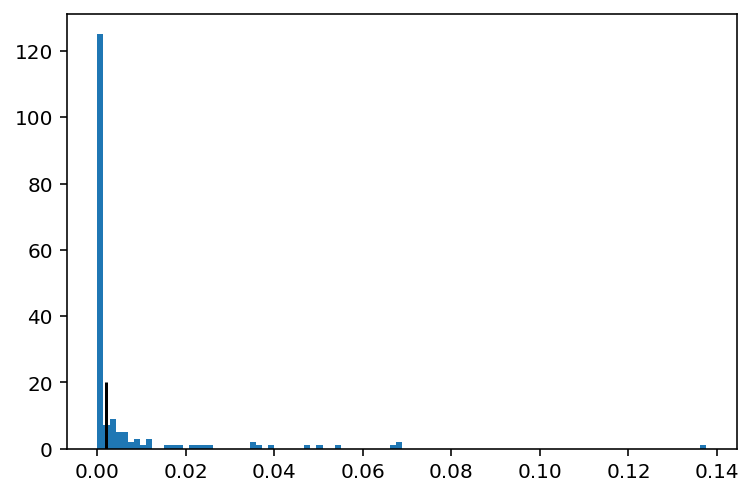

In [15]:
# the distribution of cell types across regions
lay = pd.DataFrame(index=adata_snrna_raw.obs['cluster_label'].unique())
for r in adata_snrna_raw.obs['region_label'].unique():
    ind = adata_snrna_raw.obs['region_label'].isin([r])
    lay[r] = adata_snrna_raw.obs.loc[ind, 'cluster_label'].value_counts()
    

lay = lay / lay.sum(0)

# selecting cell types very specific to PAR-POST-PRE compared to SSp
plt.hist(lay['PAR-POST-PRE'], bins=100);
plt.vlines(0.002, 0, 20, color='black');

lay = lay.loc[(lay['SSp'] == 0) & (lay['PAR-POST-PRE'] > 0.0015), :]
lay = lay.loc[np.sort(list(lay.index)), :]


rcParams["font.size"] = 8
rcParams["axes.facecolor"] = "white"
#clustermap(lay.T, figure_size=(8, 3), 
#           cmap='RdPu', log=True,
#           cluster_rows=False, cluster_cols=False)

In [16]:
# select SSp clusters and negative clusters from PAR-POST-PRE
selected = [i for i in SSp.obs['cluster_label'].unique()] + [i for i in lay.index.astype(str)]
selected_ind = adata_snrna_raw.obs['cluster_label'].isin(selected)
adata_snrna_raw = adata_snrna_raw[selected_ind, :]

In [17]:
sc.pp.filter_genes(adata_snrna_raw, min_cells=3)

adata_snrna_raw.var_names_make_unique()

adata_snrna_raw.shape

Trying to set attribute `.var` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


(6948, 38377)

In [18]:
adata_snrna_raw.obs['total_counts'] = np.array(adata_snrna_raw.X.sum(1)).flatten().shape[0]

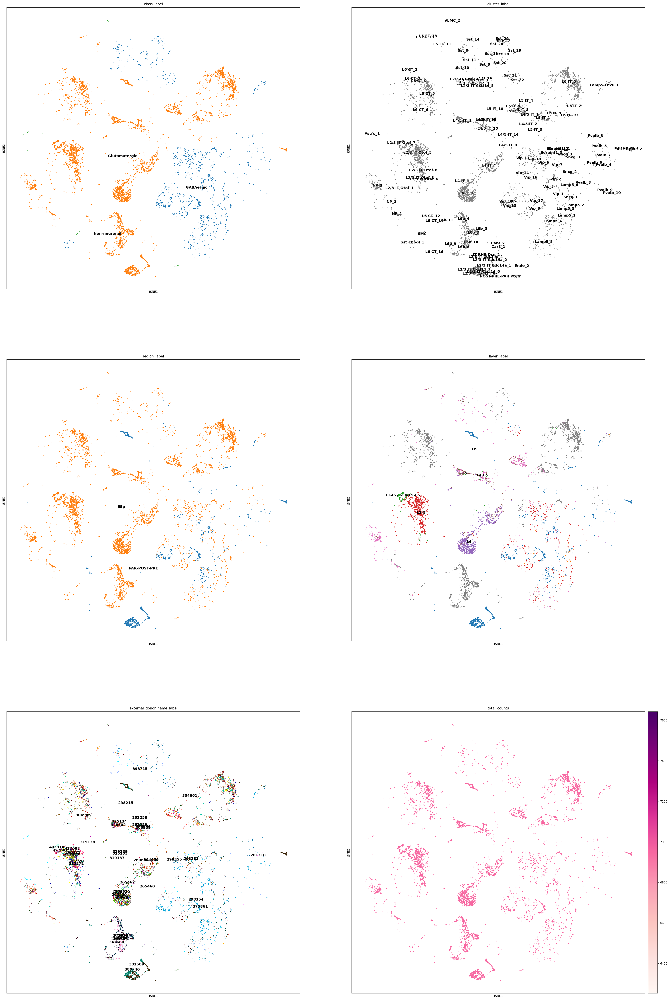

In [19]:
rcParams['figure.figsize'] = 15, 15
rcParams["axes.facecolor"] = "white"
sc.pl.tsne(adata_snrna_raw, color=['class_label', 'cluster_label', 'region_label', 
                                   'layer_label', 'external_donor_name_label',
                                   'total_counts'],
           color_map = 'RdPu', ncols = 2, legend_loc='on data',
           legend_fontsize=10)

In [20]:
adata_snrna_raw.write(sc_data_folder + 'benchmark_SSp_PAR-POST-PRE.h5ad')
sc_data_folder + 'benchmark_SSp_PAR-POST-PRE.h5ad'

'/nfs/team205/vk7/sanger_projects/large_data/brains/mouse_allen/benchmark_SSp_PAR-POST-PRE.h5ad'

Add counts matrix as `adata.raw` 

In [21]:
adata_vis = adata.copy()

sc.pp.filter_genes(adata_vis, min_cells=10)

adata_vis.var['ENSEMBL'] = adata_vis.var_names
adata_vis.var_names = adata_vis.var['SYMBOL']
adata_vis.var = adata_vis.var.drop(columns=['SYMBOL'])
adata_vis

AnnData object with n_obs × n_vars = 1393 × 15459
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'sample_name', 'sample_name2', 'image_name', 'slide', 'position', 'SSp_manual_layers'
    var: 'feature_types', 'genome', 'mt', 'n_cells_by_counts-ST8059048', 'mean_counts-ST8059048', 'log1p_mean_counts-ST8059048', 'pct_dropout_by_counts-ST8059048', 'total_counts-ST8059048', 'log1p_total_counts-ST8059048', 'n_cells_by_counts-ST8059049', 'mean_counts-ST8059049', 'log1p_mean_counts-ST8059049', 'pct_dropout_by_counts-ST8059049', 'total_counts-ST8059049', 'log1p_total_counts-ST8059049', 'n_cells_by_counts-ST8059050', 'mean_counts-ST8059050', 'log1p_mean_counts-ST8059050', 'pct_dropout_by_counts-ST8059050', 'total_counts-ST8059050', 'log1p_total_counts-ST8059050', 'n_c

In [22]:
adata_vis.raw = adata_vis
adata_snrna_raw.raw = adata_snrna_raw

## cell2location analysis  <a class="anchor" id="cell2location"></a>

Here we show how to perform the first step in one function run - train cell2location model to learn cell locations. Results are shown below and saved to:  

In [23]:
# export inferred averages in each cluster
inf_aver = scvi.external.cell2location.compute_cluster_averages(adata_snrna_raw, 'cluster_label')

In [24]:
adata_vis.var_names_make_unique()

In [25]:
# find shared genes and subset both anndata and reference signatures
intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
adata_vis = adata_vis[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for scVI model
scvi.data.setup_anndata(adata=adata_vis, batch_key="sample")
scvi.data.view_anndata_setup(adata_vis)

INFO     Using batches from adata.obs["sample"]                                              
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 1393 cells, 13565 vars, 5 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


In [26]:
intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
# adata_vis = adata_vis[:, intersect].copy()
# inf_aver = inf_aver.loc[intersect, :].copy()

In [27]:
alpha = 200

scvi_run_name = f'{scvi_run_name_global}_alphatest{alpha}'
print(scvi_run_name)
import pyro
from scvi.external.cell2location._cell2location_v3_module import LocationModelLinearDependentWMultiExperimentLocationBackgroundNormLevelGeneAlphaPyroModel
mod = scvi.external.Cell2location(
    adata_vis, cell_state_df=inf_aver/100, 
    model_class=LocationModelLinearDependentWMultiExperimentLocationBackgroundNormLevelGeneAlphaPyroModel,
    amortised=False,# single_encoder=True,
    #encoder_kwargs={'dropout_rate': 0.2},
    # the expected average cell abundance - user-provided, tissue-dependent hyper-prior:
    N_cells_per_location=8,
    detection_alpha=alpha,
) 

mod.train(max_epochs=40000, 
          batch_size=None, 
          train_size=1,
          #plan_kwargs={'optim': pyro.optim.ClippedAdam(optim_args={'lr': 0.002, 'clip_norm': 10})},
          plan_kwargs={'optim': pyro.optim.Adam(optim_args={'lr': 0.002})},
          use_gpu=True)

# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_vis = mod.export_posterior(
    adata_vis, sample_kwargs={'num_samples': 1000, 'batch_size': 2020, 'use_gpu': False}
)

# Save model
mod.save(f"{scvi_run_name}", overwrite=True)
# can be loaded later like this:
# mod = scvi.external.Cell2location.load(f"{scvi_run_name}", adata_vis)

# Save anndata object with results
adata_file = f"{scvi_run_name}/sp.h5ad"
adata_vis.write(adata_file)

# plot ELBO loss history during training, removing first 100 epochs from the plot

/nfs/team205/vk7/sanger_projects/cell2location_paper/notebooks/selected_results/mouse_brain_allen//SSp_mapping_Adam_lr0002_40k_normalisingSS2_100_alphatest200


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sampling global variables, sample: 100%|██████████| 999/999 [04:07<00:00,  4.03it/s]


... storing 'sample' as categorical
... storing 'sample_name' as categorical
... storing 'sample_name2' as categorical
... storing 'image_name' as categorical
... storing 'slide' as categorical
... storing 'position' as categorical
... storing 'SSp_manual_layers' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


In [28]:
mod.detection_mean_

0.11927495756885408

In [29]:
adata_vis.uns['mod']['post_sample_means']['m_g_mean']

array([[0.1211931]], dtype=float32)

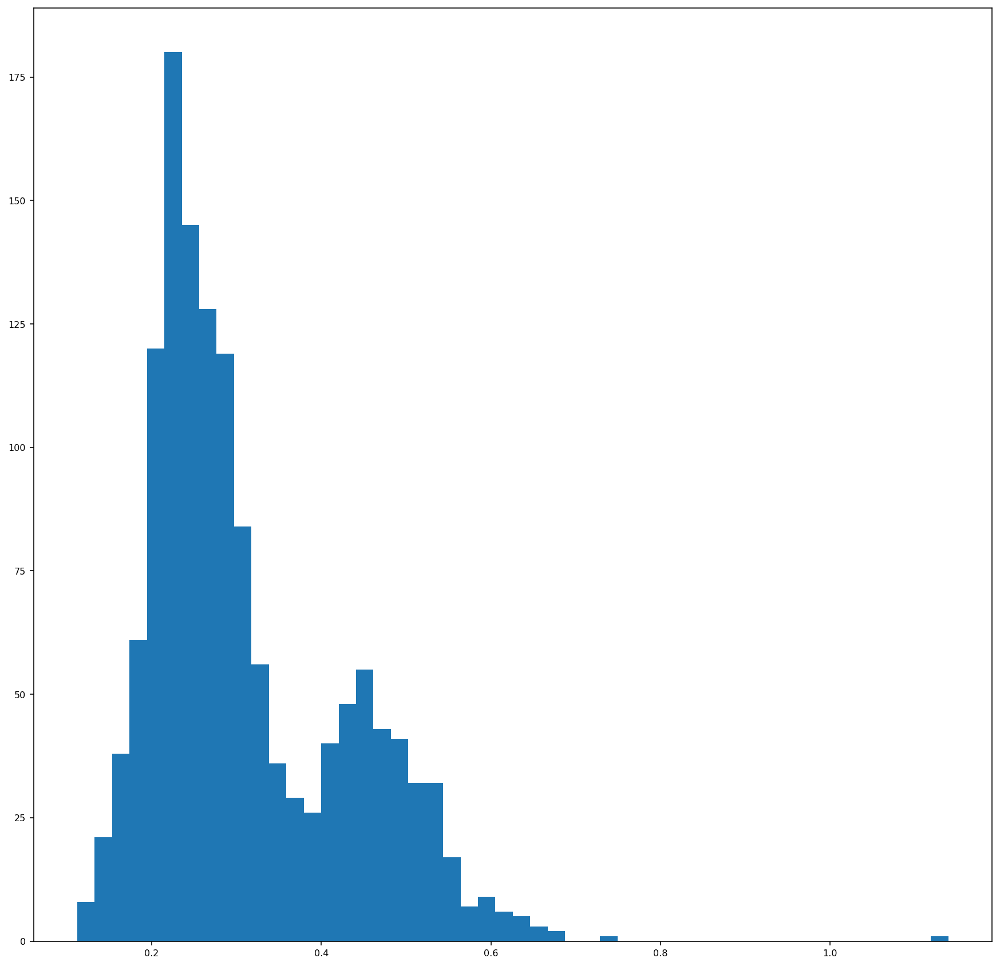

In [30]:
plt.hist(adata_vis.uns['mod']['post_sample_means']['detection_y_s'].flatten(), bins=50);

In [31]:
def select_slide(adata, s, s_col='sample'):
    r""" Select data for one slide from the spatial anndata object.

    :param adata: Anndata object with multiple spatial samples
    :param s: name of selected sample
    :param s_col: column in adata.obs listing sample name for each location
    """

    slide = adata[adata.obs[s_col].isin([s]), :]
    s_keys = list(slide.uns['spatial'].keys())
    s_spatial = np.array(s_keys)[[s in k for k in s_keys]][0]

    slide.uns['spatial'] = {s_spatial: slide.uns['spatial'][s_spatial]}

    return slide

In [32]:
import matplotlib as mpl
mod.plot_history(5000)
plt.savefig(f"{scvi_run_name}/training_ELBO_history_minus5k.png",
            bbox_inches='tight')
plt.close()
mod.plot_history(0)
plt.savefig(f"{scvi_run_name}/training_ELBO_history_all.png",
            bbox_inches='tight')
plt.close()

# Examine reconstruction accuracy to assess if there are any issues with mapping
# the plot should be roughly diagonal, strong deviations will signal problems
mod.plot_QC()
plt.savefig(f"{scvi_run_name}/reconstruction_accuracy_histogram.png",
            bbox_inches='tight')
plt.close()

# add 5% quantile, representing confident cell abundance, 'at least this amount is present', 
# to adata.obs with nice names for plotting
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']

def plot_spatial_per_cell_type(adata, 
                               cell_type=adata_vis.uns['mod']['factor_names'][0],
                               samples=['A1', 'A2'],
                              ncol=2, prefix=''):
    n_samples = len(samples)
    nrow = int(np.ceil(n_samples / ncol))
    fig, axs = plt.subplots(nrow, ncol, figsize=(24, 8))
    if nrow == 1:
        axs = axs.reshape((1, ncol))

    col_name = f'{prefix}{cell_type}'
    vmax = np.quantile(adata_vis.obs[col_name].values, 0.99999)
    adata_vis.obs[cell_type] = adata_vis.obs[col_name].copy()

    from itertools import chain
    ind = list(chain(*[[(i, j) for i in range(nrow)] for j in range(ncol)]))

    for i, s in enumerate(samples):
        sp_data_s = select_slide(adata, s, s_col='sample')
#         print(sp_data_s.shape)
        sc.pl.spatial(sp_data_s, cmap='magma',
                      color=cell_type, 
                      size=1.3, img_key='hires', alpha_img=1,
                      vmin=0, vmax=vmax, ax=axs[ind[i][0],ind[i][1]], show=False
                                            )
        axs[ind[i][0],ind[i][1]].title.set_text(cell_type+'\n'+s)
    
    if len(samples) < len(axs.flatten()):
        for i in range(len(samples), len(axs.flatten())):
            axs[ind[i][0],ind[i][1]].axis('off')
    
    fig.tight_layout(pad=0.5)

    return fig

fig_dir = f"{scvi_run_name}/spatial/"
import os
if not os.path.exists(fig_dir):
    os.mkdir(fig_dir)
adata_vis.obs['total_cell_abundance'] = adata_vis.uns['mod']['post_sample_means']['w_sf'].sum(1).flatten()
fig = plot_spatial_per_cell_type(adata_vis, cell_type='total_cell_abundance', prefix='', samples=adata_vis.obs['sample'].unique());
fig.savefig(f"{fig_dir}total_cell_abundance.png", bbox_inches='tight')
fig.clear()
plt.close(fig)

adata_vis.obs['detection_y_s'] = adata_vis.uns['mod']['post_sample_q05']['detection_y_s']
fig = plot_spatial_per_cell_type(adata_vis, cell_type='detection_y_s', prefix='', samples=adata_vis.obs['sample'].unique());
fig.savefig(f"{fig_dir}detection_y_s.png", bbox_inches='tight')
fig.clear()
plt.close(fig)

fig = plot_spatial_per_cell_type(adata_vis, cell_type='total_counts', prefix='', samples=adata_vis.obs['sample'].unique());
fig.savefig(f"{fig_dir}total_RNA_counts.png", bbox_inches='tight')
fig.clear()
plt.close(fig)

from re import sub
import os
for c in adata_vis.uns['mod']['factor_names']:
    fig = plot_spatial_per_cell_type(adata_vis, cell_type=c, samples=adata_vis.obs['sample'].unique())
    fig_dir = f"{scvi_run_name}/spatial/"
    if not os.path.exists(fig_dir):
        os.mkdir(fig_dir)
    fig_dir = f"{scvi_run_name}/spatial/per_cell_type/"
    if not os.path.exists(fig_dir):
        os.mkdir(fig_dir)
    fig.savefig(f"{fig_dir}W_cell_abundance_q05_{sub('/', '_', c)}.png",
                bbox_inches='tight')
    fig.clear()
    plt.close(fig)

f"{scvi_run_name}/spatial/per_cell_type/"

with mpl.rc_context({"axes.facecolor": "black"}):
    clust_names = adata_vis.uns['mod']['factor_names']

    for s in adata_vis.obs['sample'].unique():

        s_ind = adata_vis.obs['sample'] == s
        s_keys = list(adata_vis.uns['spatial'].keys())
        s_spatial = np.array(s_keys)[[s in i for i in s_keys]][0]

        fig = sc.pl.spatial(adata_vis[s_ind, :], cmap='magma',
                            color=clust_names, ncols=5, library_id=s_spatial,
                            size=1.3, img_key='hires', alpha_img=1,
                            vmin=0, vmax='p99.2',
                            return_fig=True, show=False)

        fig_dir = f"{scvi_run_name}/spatial/"
        if not os.path.exists(fig_dir):
            os.mkdir(fig_dir)
        fig_dir = f"{scvi_run_name}/spatial/per_sample/"
        if not os.path.exists(fig_dir):
            os.mkdir(fig_dir)

        plt.savefig(f"{fig_dir}W_cell_abundance_q05_{s}.png",
                    bbox_inches='tight')
        plt.close()


with mpl.rc_context({"axes.facecolor": "black"}):
    clust_names = adata_vis.uns['mod']['factor_names']

    decomposition = adata_vis.obsm["q05_cell_abundance_w_sf"]
    decomposition = (decomposition.T / decomposition.sum(1)).T
    adata_vis.obs.loc[:, adata_vis.obsm["q05_cell_abundance_w_sf"].columns] = decomposition

    for s in adata_vis.obs['sample'].unique():

        s_ind = adata_vis.obs['sample'] == s
        s_keys = list(adata_vis.uns['spatial'].keys())
        s_spatial = np.array(s_keys)[[s in i for i in s_keys]][0]

        fig = sc.pl.spatial(adata_vis[s_ind, :], cmap='magma',
                            color=clust_names, ncols=5, library_id=s_spatial,
                            size=1.3, img_key='hires', alpha_img=1,
                            vmin=0, vmax='p99.5',
                            return_fig=True, show=False)

        fig_dir = f"{scvi_run_name}/spatial/"
        if not os.path.exists(fig_dir):
            os.mkdir(fig_dir)
        fig_dir = f"{scvi_run_name}/spatial/per_sample/"
        if not os.path.exists(fig_dir):
            os.mkdir(fig_dir)

        plt.savefig(f"{fig_dir}W_cell_proportion_q05_{s}.png",
                    bbox_inches='tight')
        plt.close()
# add 5% quantile, representing confident cell abundance, 'at least this amount is present', 
# to adata.obs with nice names for plotting
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']

# look at the total cell abundance for each experiment
with mpl.rc_context({'axes.facecolor': 'white', 'font.size': 10, 
                     'figure.figsize': [5, 15]}):
    for i, n in enumerate(adata_vis.obs['sample'].unique()):
        plt.subplot(len(adata_vis.obs['sample'].unique()), 1, i+1)
        total_cell_abundance = adata_vis.uns['mod']['post_sample_means']['w_sf'].sum(1).flatten()
        total_cell_abundance_ = total_cell_abundance[adata_vis.obs['sample'] == n]
        plt.hist(total_cell_abundance_, bins=100);
        plt.title(n)
        plt.xlabel(r'Total cell abundance ($sum_f w_sf$) for each experiment')
        plt.xlim(0, total_cell_abundance.max())
    plt.savefig(f"{scvi_run_name}/total_cell_abundance.png",
                bbox_inches='tight')
    plt.close()

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attrib

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attrib

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attrib

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attrib